In [107]:
import rasterio as rio
from rasterio.plot import show
from rasterio.enums import Resampling
from rasterio.mask import mask
import geopandas as gpd
from shapely.geometry import box
import matplotlib.pyplot as plt
import os, fnmatch

In [81]:
# Crop data means to the study area
src = rio.open("20230316_IMG_DATA\\MSK_CLASSI_B00.jp2")

study_area = gpd.read_file("singapore_boundary.geojson")
study_area = study_area.to_crs("EPSG:32648")
xmin, ymin, xmax, ymax = study_area.total_bounds

# Use gdal to crop
print(xmin, ymin, xmax, ymax)

np.floor(xmin), np.floor(ymin), np.ceil(xmax), np.ceil(ymax)

344143.86704735993 129882.88733377506 398819.2100521253 163233.2351125228


(344143.0, 129882.0, 398820.0, 163234.0)

In [35]:
# In the end I brute forced the solution by using a GL command to warp the cloud mask raster into the
# dimensions of the singapore 10-m resolution cropped raster:
# gdalwarp -ts 5468 3335 -r bilinear src_file dst_file

# Resampling cloud mask - might be better to resample to size of cropped singapore raster files
# upscale_factor = 6

# with rio.open("20230316_IMG_DATA\\MSK_CLASSI_B00.jp2") as dataset:

#     # resample data to target shape
#     data = dataset.read(
#         out_shape=(
#             dataset.count,
#             int(dataset.height * upscale_factor),
#             int(dataset.width * upscale_factor)
#         ),
#         resampling=Resampling.bilinear
#     )
    
#     profile = data.profile

#     # scale image transform
#     transform = dataset.transform * dataset.transform.scale(
#         (dataset.width / data.shape[-1]),
#         (dataset.height / data.shape[-2])
#     )
    
# dataset.close()

# # We'll mask anything that is present in any layer
# data_means = np.mean(data, axis = 0)

# # Now we have a 1 band raster that is masked regardless of layer
# data_means[data_means != 0] = 1

# profile

In [36]:
# MSK_CLASSI: A band-independent raster file composed of the classification
# masks (layer 1: cloud, 2: cirrus, 3: snow). This mask will be defined at a
# spatial resolution of 60 m. We only need band 1 since singapore has no snow
data.shape

(3, 3336, 5466)

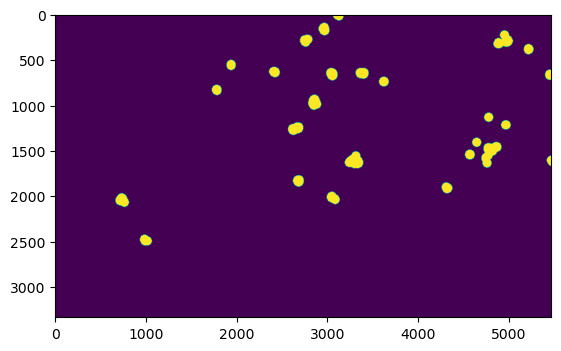

<Axes: >

In [82]:
dataset = rio.open("20230316_IMG_DATA\\MSK_CLASSI_B00_UPSAMPLED_CROPPED.tif")

data = dataset.read()

# We'll mask anything that is present in any layer
data_means = np.mean(data, axis = 0)

# Now we have a 1 band raster that is masked regardless of layer
data_means[data_means != 0] = 1

show(data_means)

In [67]:
red = rio.open("20230316_IMG_DATA\\T48NUG_20230316T031519_B04_CROPPED.tif")
nir = rio.open("20230316_IMG_DATA\\T48NUG_20230316T031519_B08_CROPPED.tif")

# Note that this data is in uint16
red_data = red.read(1)
nir_data = nir.read(1)

# need to convert to float or else there will be underflow
red_data = red_data / 10000
nir_data = nir_data / 10000

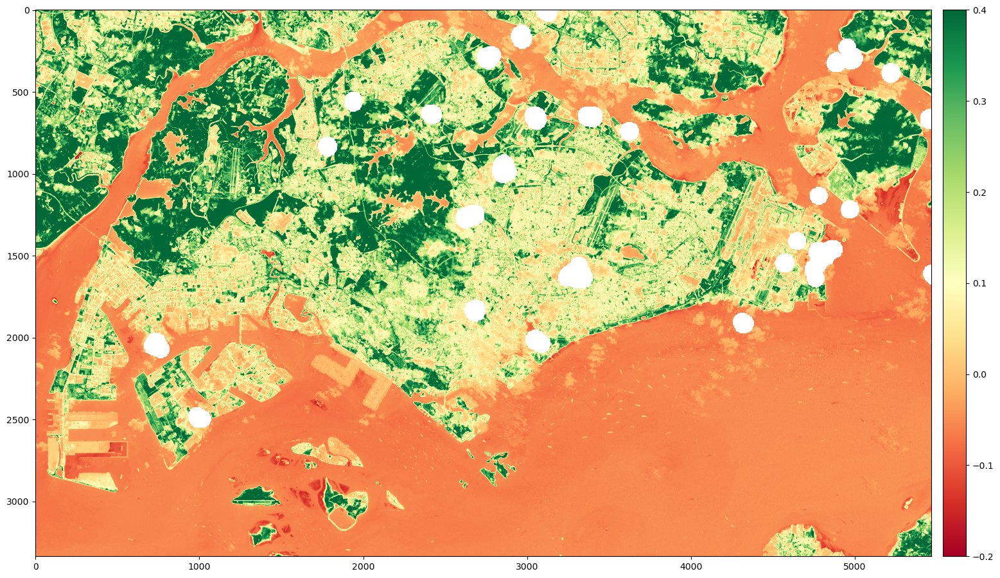

In [84]:
ndvi = (nir_data - red_data) / (nir_data + red_data)

ndvi_masked = np.ma.masked_array(ndvi, mask = data_means)

fig, ax = plt.subplots(figsize = (18,12))
# show(ndvi, cmap = "RdYlGn")
image_hidden = ax.imshow(ndvi_masked, cmap='RdYlGn', vmin = -0.2, vmax = 0.4)
# show(data_means, ax = ax)
# this is pretty good for ensuring that the colorbar is same height as graph
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
fig.colorbar(image_hidden, cax = cax)

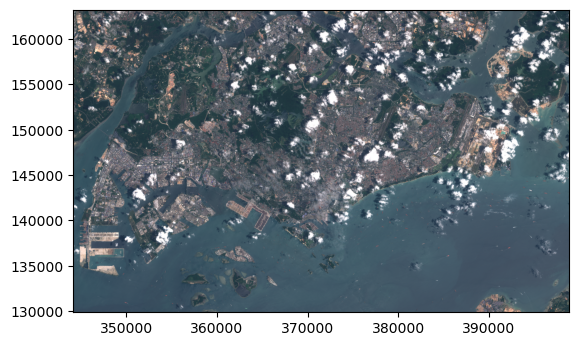

<Axes: >

In [88]:
tcc = rio.open("20230316_IMG_DATA\\T48NUG_20230316T031519_TCI_CROPPED.tif")

show(tcc)

In [209]:
# Had to manually get it because of sorting issues

filenames = ['T48NUG_20230316T031519_B01_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B02_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B03_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B04_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B05_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B06_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B07_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B08_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B8A_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B09_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B10_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B11_UPSAMPLED_CROPPED.TIF',
 'T48NUG_20230316T031519_B12_UPSAMPLED_CROPPED.TIF']

In [210]:
%%time

# grab profile data
src_init = rio.open(f"20230316_IMG_DATA\\{filenames[0]}")

profile = src_init.profile

# We are stacking the 10 bands (all bands except pan)
profile.update(dtype = np.float32, nodata = np.nan, count = 13)

src_init.close()

# Test writing a masked array
# Yep, writing out a masked array works perfectly fine, nodata are written as specified in the 
# profile
dst = rio.open(
    # the output stacked tifs SHOULD be output into the same directory as the .py script
    f"SINGAPORE_20230316_STACKED.tif",
    "w",
    **profile
)

# Write into a stacked raster
for index, file in enumerate(filenames):
    src = rio.open(f"20230316_IMG_DATA\\{file}")
    
    # Get 2D array
    data = src.read(1)
    src.close()
    
    # Normalize to reflectances
    # Apparently with product baseline 4.00, the calculation is now (data - 1000) / 10000!!
    # This applies to data produced after October 26 2021
    # Normalization remains data = data / 10000 prior to this date
    data = (data - 1000) / 10000
    
    # Explicitly cast to the correct data type
    dst.write(data.astype(np.float32), index + 1)

dst.close()

CPU times: total: 37 s
Wall time: 38.1 s


In [211]:
from s2cloudless import S2PixelCloudDetector, download_bands_and_valid_data_mask

# The cloud detect requires an array of [N, height, width, 13] and will run the classifier
# We need to upsample all of the sentinel 2 data and then normalize the data to reflectance values

# We can specify the following arguments in the initialization of a S2PixelCloudDetector:

#     threshold - cloud probability threshold value. All pixels with cloud probability above 
#                 threshold value are masked as cloudy pixels. Default is 0.4.
#     average_over - Size of the disk in pixels for performing convolution (averaging probability 
#                 over pixels). For this resolution 4 is appropriate.
#     dilation_size - Size of the disk in pixels for performing dilation. For this resolution 2 
#                 is appropriate.
#     all_bands - Flag specifying that input images will consists of all 13 Sentinel-2 bands. 
#                  It has to be set to True if we would download all bands. If you define a layer 
#                  that would return only 10 bands, then this parameter should be set to False.

cloud_detector = S2PixelCloudDetector(threshold=0.4, average_over=4, dilation_size=2, all_bands=True)

In [212]:
%%time

src = rio.open("SINGAPORE_20230316_STACKED.tif")

dataset = src.read()

# Move the band axis to the back
# Both methods accomplish the same thing
# dataset_image = np.moveaxis(dataset_image, 0 -1)
dataset_image = rio.plot.reshape_as_image(dataset)

# Get cloud probability maps
cloud_prob = cloud_detector.get_cloud_probability_maps(dataset_image[np.newaxis, ...])

CPU times: total: 9min 12s
Wall time: 1min 30s


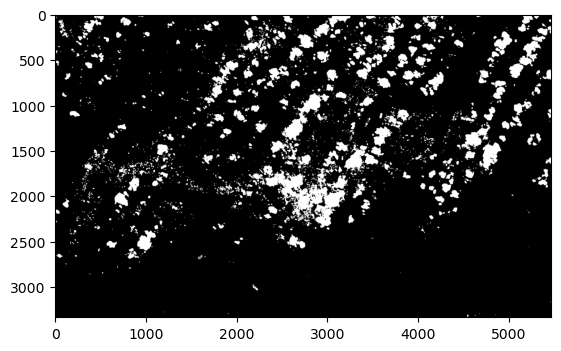

In [215]:
# Calculate cloud mask from probability map
# Much faster than getting cloud mask directly from cloud_detector, esp if you want to play around 
# with threshold
cloud_mask = cloud_detector.get_mask_from_prob(cloud_prob, threshold = 0.4)

plt.imshow(cloud_mask[0], cmap=plt.cm.gray)

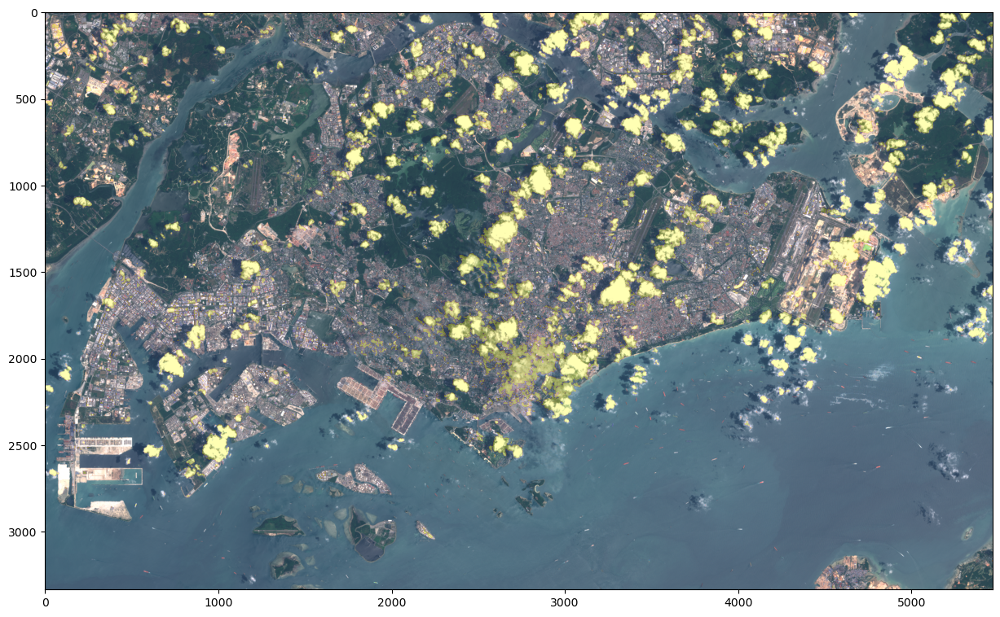

In [217]:
# It fuckin works man ez
true_color_image = (dataset_image[..., [3, 2, 1]] * 3.5).clip(0, 1)
is_cloud = cloud_mask[0]

_, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
ax.imshow(true_color_image)
ax.imshow(is_cloud, cmap="gnuplot", alpha=0.3 * is_cloud)

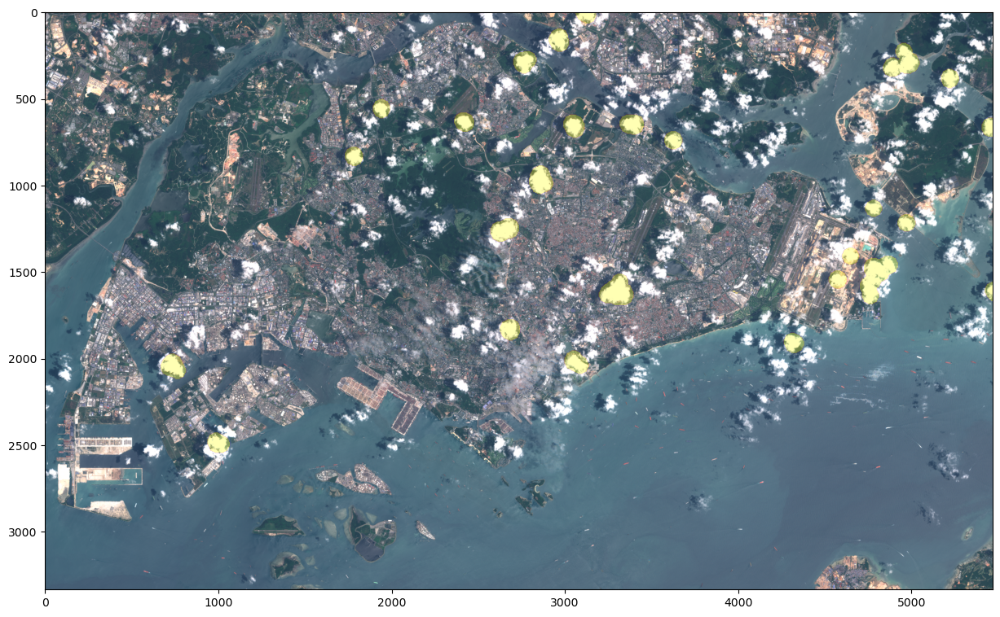

In [222]:
# Compare to the cloud mask provided by sentinel2 itself

_, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
ax.imshow(true_color_image)
ax.imshow(data_means, cmap="gnuplot", alpha=0.3 * data_means)

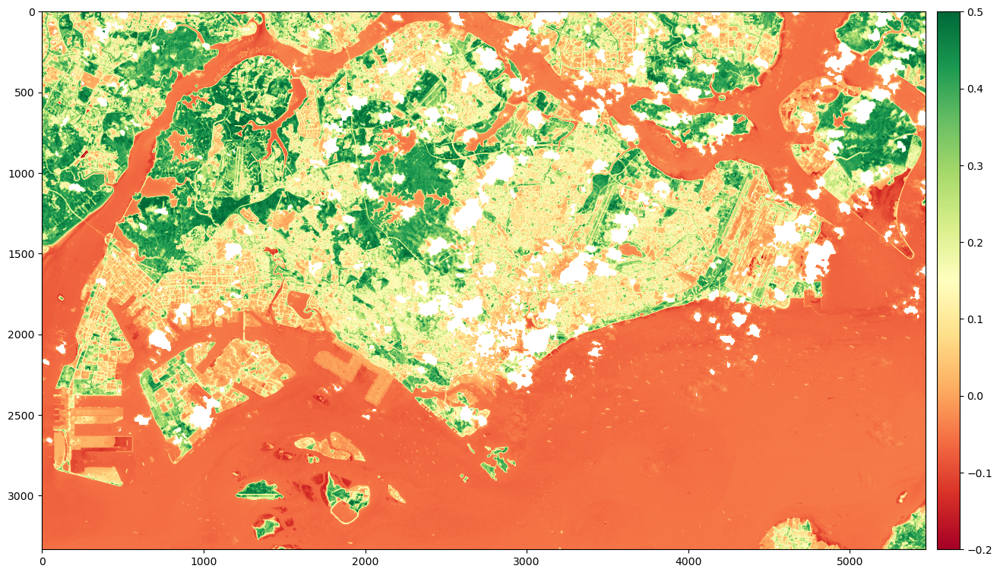

In [221]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))

image_hidden = ax.imshow(ndvi, cmap='RdYlGn', vmin = -0.2, vmax = 0.5)
ax.imshow(is_cloud, cmap=plt.cm.gray, alpha = is_cloud * 1)

cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
fig.colorbar(image_hidden, cax = cax)

In [228]:
cloud_mask = cloud_mask.squeeze()

profile.update(count = 1, nodata = 255, dtype = np.uint8)

dst = rio.open("20230316_CLOUDMASK.tif", "w", **profile)

dst.write(cloud_mask, 1)

dst.close()

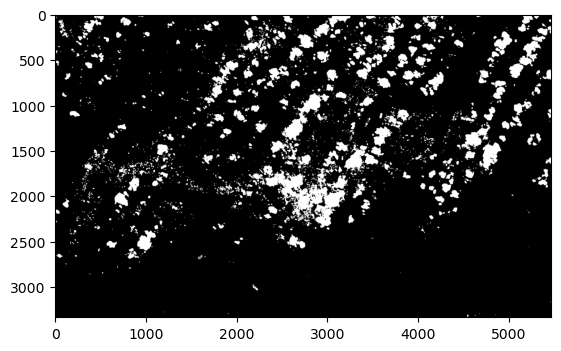

In [207]:
plt.imshow(cloud_mask[0], cmap=plt.cm.gray)

In [208]:
src.close()

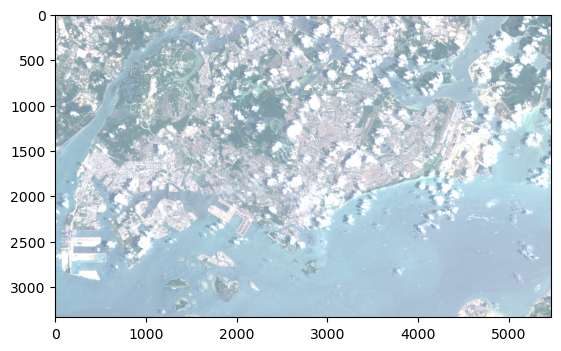

In [176]:
true_color_images = np.clip(dataset_image[..., [3, 2, 1]] * 3.5, 0, 1)
plt.imshow(true_color_images)
plt.show()

In [154]:
empty = np.empty([])
band_1 = np.arange(1,10).reshape(3,3)
band_2 = np.arange(11,20).reshape(3,3)

test = np.stack([band_1, band_2])
print(test.shape)

new_test = np.moveaxis(test, 0, -1)
print(new_test)

(2, 3, 3)
[[[ 1 11]
  [ 2 12]
  [ 3 13]]

 [[ 4 14]
  [ 5 15]
  [ 6 16]]

 [[ 7 17]
  [ 8 18]
  [ 9 19]]]


In [129]:
# current_dir = os.getcwd()

# filenames = os.listdir(os.path.join(current_dir, "20230316_IMG_DATA"))

# filenames = [file for file in filenames if "UPSAMPLED_CROPPED" in file]

# filenames = filenames[2:-1]

In [202]:
dataset

array([[[0.237 , 0.2381, 0.2392, ..., 0.2184, 0.2184, 0.2184],
        [0.2358, 0.2368, 0.2378, ..., 0.2188, 0.2188, 0.2188],
        [0.2346, 0.2354, 0.2363, ..., 0.2193, 0.2193, 0.2192],
        ...,
        [0.2535, 0.2535, 0.2535, ..., 0.2348, 0.2342, 0.2336],
        [0.2537, 0.2537, 0.2537, ..., 0.2359, 0.2353, 0.2348],
        [0.2538, 0.2538, 0.2538, ..., 0.237 , 0.2364, 0.2359]],

       [[0.2022, 0.2038, 0.2026, ..., 0.1863, 0.1863, 0.186 ],
        [0.2019, 0.2038, 0.204 , ..., 0.1858, 0.1859, 0.1856],
        [0.1998, 0.2003, 0.2021, ..., 0.1855, 0.1859, 0.186 ],
        ...,
        [0.2312, 0.2311, 0.2307, ..., 0.2144, 0.2176, 0.2184],
        [0.2314, 0.2318, 0.2313, ..., 0.2141, 0.2178, 0.2248],
        [0.2322, 0.2328, 0.2313, ..., 0.216 , 0.2191, 0.226 ]],

       [[0.2015, 0.2029, 0.1983, ..., 0.1655, 0.1647, 0.1642],
        [0.1986, 0.1998, 0.1981, ..., 0.1655, 0.1642, 0.1635],
        [0.192 , 0.1919, 0.1923, ..., 0.1654, 0.1647, 0.1631],
        ...,
        [0.2